In [209]:
import requests
import pandas as pd
from datetime import timedelta, date
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
import pickle



# ReadMe
## How to Use the SoGs code
Run all cells in train_models.py to train all logistic regression models and run necessary data. Additionally, this will save down the most recent sogs data as a .csv for prediction. 

Make predictions using make_predictions.py

In [ ]:
# enter today's date if you want most recent SoG data 
END_DATE  = "12-14-2023"

In [214]:
def get_player_sogs(player_stats:dict)->int:
    player_name = player_stats["name"]["default"]
    player_id = player_stats["playerId"]
    player_sogs = player_stats["shots"]

    dict_sogs = {"Player ID":player_id, "Player Name":player_name, "SoGs":player_sogs}

    df_sogs = pd.DataFrame(data=dict_sogs, index=[player_id])

    return df_sogs

def get_game_sogs(game_id:str)->pd.DataFrame:
    game_id = str(game_id)
    resp = requests.get(f"https://api-web.nhle.com/v1/gamecenter/{game_id}/boxscore")    
    game_info = resp.json()
    boxscore = game_info["boxscore"]["playerByGameStats"]
    print(game_info)
       

    list_sogs_df = []
    for team in ["awayTeam", "homeTeam"]:
        for unit in ["forwards", "defense"]:
            player_list = boxscore[team][unit]
            for player_stats in player_list:
                player_sogs = get_player_sogs(player_stats)

                list_sogs_df.append(player_sogs)


    game_sogs = pd.concat(list_sogs_df)


    return game_sogs

def get_game_ids(calendar_date:str):
    # dates should have the format 2023-11-30
    print(calendar_date)
    resp = requests.get(f"https://api-web.nhle.com/v1/schedule/{calendar_date}")    
    data = resp.json()
    #print(data)
    schedule = data["gameWeek"][0]["games"]

    #print(schedule)
    list_game_ids = []
    for game in schedule:
        game_id = game["id"]
        list_game_ids.append(game_id)

    return list_game_ids

def get_calendar_day_sogs(calendar_date):

    game_ids = get_game_ids(calendar_date=calendar_date)
    list_game_sogs = []
    for id in game_ids:
        df_game_sogs = get_game_sogs(id)
        list_game_sogs.append(df_game_sogs)

    if len(list_game_sogs) > 0:
        calendar_day_sogs = pd.concat(list_game_sogs)

        calendar_day_sogs["Date"] = calendar_date
        return calendar_day_sogs
    else:
        return "No Games"

def get_all_sogs_data(start_date, end_date):
    sdate = pd.to_datetime(start_date)   # start date
    edate = pd.to_datetime(end_date)   # end date

    date_list = pd.date_range(sdate,edate-timedelta(days=1),freq='d')

    list_date_sogs = []
    for d in date_list:
        formatted_date = d.strftime("%Y-%m-%d")
        calendar_day_sogs = get_calendar_day_sogs(formatted_date)
        list_date_sogs.append(calendar_day_sogs)

    def filter_no_games(element):
        # Filter out dates with no games
        if (element == "No Games"):
            return False
        else:
            return True

    filtered_sogs = filter(filter_no_games, list_date_sogs)

    filtered_sogs = list(filter(lambda x: type(x) != str, list_date_sogs))
    print(filtered_sogs)

    all_sogs = pd.concat(filtered_sogs)

    #print(calendar_day_sogs)
    return all_sogs



#get_game_sogs("2023020340")
#get_calendar_day_sogs("2023-11-30")

# Start of NHL season is 10/10/2023
test_sogs_data = get_all_sogs_data("10-10-2023", END_DATE)

2023-10-10
{'id': 2023020001, 'season': 20232024, 'gameType': 2, 'gameDate': '2023-10-10', 'venue': {'default': 'Amalie Arena'}, 'startTimeUTC': '2023-10-10T21:30:00Z', 'easternUTCOffset': '-04:00', 'venueUTCOffset': '-04:00', 'tvBroadcasts': [{'id': 281, 'market': 'N', 'countryCode': 'CA', 'network': 'TVAS'}, {'id': 282, 'market': 'N', 'countryCode': 'CA', 'network': 'SN'}, {'id': 309, 'market': 'N', 'countryCode': 'US', 'network': 'ESPN'}, {'id': 329, 'market': 'N', 'countryCode': 'US', 'network': 'ESPN+'}], 'gameState': 'OFF', 'gameScheduleState': 'OK', 'period': 3, 'periodDescriptor': {'number': 3, 'periodType': 'REG'}, 'awayTeam': {'id': 18, 'name': {'default': 'Predators'}, 'abbrev': 'NSH', 'score': 3, 'sog': 31, 'faceoffWinningPctg': 43.3, 'powerPlayConversion': '1/4', 'pim': 10, 'hits': 18, 'blocks': 10, 'logo': 'https://assets.nhle.com/logos/nhl/svg/NSH_light.svg'}, 'homeTeam': {'id': 14, 'name': {'default': 'Lightning'}, 'abbrev': 'TBL', 'score': 5, 'sog': 34, 'faceoffWinning

In [215]:
print(test_sogs_data)

         Player ID  Player Name  SoGs        Date
8479996    8479996     C. Glass     2  2023-10-10
8476887    8476887  F. Forsberg     6  2023-10-10
8476925    8476925   C. Sissons     3  2023-10-10
8478508    8478508    Y. Trenin     1  2023-10-10
8474679    8474679   G. Nyquist     2  2023-10-10
...            ...          ...   ...         ...
8477971    8477971   A. Englund     1  2023-12-13
8474563    8474563   D. Doughty     2  2023-12-13
8481606    8481606    J. Spence     2  2023-12-13
8479421    8479421  J. Moverare     2  2023-12-13
8479998    8479998  M. Anderson     2  2023-12-13

[16050 rows x 4 columns]


In [216]:
def calculate_trailing_averages(sogs_data:pd.DataFrame)->pd.DataFrame:
    unique_player_ids = sogs_data["Player ID"].unique()

    list_moving_averages_sogs = []
    for player_id in unique_player_ids:
        player_sogs = sogs_data[sogs_data["Player ID"]==player_id]
        player_sogs.sort_values(by="Date", ascending=True, inplace=True)

        player_sogs['sogs_calc'] = player_sogs['SoGs'].shift(1)

        # Calculate the trailing averages of each date for the Player
        player_sogs.loc[:, "Trailing 1 Game Avg SoGs"] = player_sogs.loc[:, 'sogs_calc'].rolling(window=1).mean()
        player_sogs.loc[:, "Trailing 3 Game Avg SoGs"] = player_sogs.loc[:, 'sogs_calc'].rolling(window=3).mean()
        player_sogs.loc[:, "Trailing 5 Game Avg SoGs"] = player_sogs.loc[:, 'sogs_calc'].rolling(window=5).mean()
        player_sogs.loc[:, "Trailing 7 Game Avg SoGs"] = player_sogs.loc[:, 'sogs_calc'].rolling(window=7).mean()
        player_sogs.loc[:, "Trailing 10 Game Avg SoGs"] = player_sogs.loc[:, 'sogs_calc'].rolling(window=10).mean()
        player_sogs['Average SoGs'] = player_sogs['sogs_calc'].expanding().mean()

        # For Current Datapoint prediction information
        player_sogs.loc[:, "Prediction 1 Game Avg SoGs"] = player_sogs.loc[:, 'SoGs'].rolling(window=1).mean()
        player_sogs.loc[:, "Prediction 3 Game Avg SoGs"] = player_sogs.loc[:, 'SoGs'].rolling(window=3).mean()
        player_sogs.loc[:, "Prediction 5 Game Avg SoGs"] = player_sogs.loc[:, 'SoGs'].rolling(window=5).mean()
        player_sogs.loc[:, "Prediction 7 Game Avg SoGs"] = player_sogs.loc[:, 'SoGs'].rolling(window=7).mean()
        player_sogs.loc[:, "Prediction 10 Game Avg SoGs"] = player_sogs.loc[:, 'SoGs'].rolling(window=10).mean()
        player_sogs['Prediction Average SoGs'] = player_sogs['SoGs'].expanding().mean()

        # If there isn't enough data then 
        player_sogs = player_sogs.fillna(0)

        player_sogs["Trailing 3 Game Avg SoGs"] = player_sogs["Trailing 3 Game Avg SoGs"].fillna(player_sogs["Trailing 1 Game Avg SoGs"])
        player_sogs["Trailing 5 Game Avg SoGs"] = player_sogs["Trailing 5 Game Avg SoGs"].fillna(player_sogs["Trailing 3 Game Avg SoGs"])
        player_sogs["Trailing 7 Game Avg SoGs"] = player_sogs["Trailing 7 Game Avg SoGs"].fillna(player_sogs["Trailing 5 Game Avg SoGs"])
        player_sogs["Trailing 10 Game Avg SoGs"] = player_sogs["Trailing 10 Game Avg SoGs"].fillna(player_sogs["Trailing 7 Game Avg SoGs"])

        player_sogs["Prediction 3 Game Avg SoGs"] = player_sogs["Prediction 3 Game Avg SoGs"].fillna(player_sogs["Prediction 1 Game Avg SoGs"])
        player_sogs["Prediction 5 Game Avg SoGs"] = player_sogs["Prediction 5 Game Avg SoGs"].fillna(player_sogs["Prediction 3 Game Avg SoGs"])
        player_sogs["Prediction 7 Game Avg SoGs"] = player_sogs["Prediction 7 Game Avg SoGs"].fillna(player_sogs["Prediction 5 Game Avg SoGs"])
        player_sogs["Prediction 10 Game Avg SoGs"] = player_sogs["Prediction 10 Game Avg SoGs"].fillna(player_sogs["Prediction 7 Game Avg SoGs"])

        player_sogs['Over 1.5'] = np.where(player_sogs['SoGs'] > 1, 1, 0)
        player_sogs['Over 2.5'] = np.where(player_sogs['SoGs'] > 2, 1, 0)
        player_sogs['Over 3.5'] = np.where(player_sogs['SoGs'] > 3, 1, 0)
        player_sogs['Over 4.5'] = np.where(player_sogs['SoGs'] > 4, 1, 0)

        list_moving_averages_sogs.append(player_sogs)
    
    all_moving_averages = pd.concat(list_moving_averages_sogs)
    return all_moving_averages

test_moving_avgs = calculate_trailing_averages(test_sogs_data)


print(test_moving_avgs[test_moving_avgs["Player Name"]== "J. Hughes"])

/var/folders/42/y4tghn554_s5413ck4sy3p4w0000gn/T/ipykernel_76579/3471184097.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_sogs.sort_values(by="Date", ascending=True, inplace=True)
/var/folders/42/y4tghn554_s5413ck4sy3p4w0000gn/T/ipykernel_76579/3471184097.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  player_sogs['sogs_calc'] = player_sogs['SoGs'].shift(1)
/var/folders/42/y4tghn554_s5413ck4sy3p4w0000gn/T/ipykernel_76579/3471184097.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

         Player ID Player Name  SoGs        Date  sogs_calc  \
8481559    8481559   J. Hughes     4  2023-10-12        0.0   
8481559    8481559   J. Hughes     6  2023-10-13        4.0   
8481559    8481559   J. Hughes     6  2023-10-16        6.0   
8481559    8481559   J. Hughes     6  2023-10-20        6.0   
8481559    8481559   J. Hughes     2  2023-10-24        6.0   
8481559    8481559   J. Hughes     4  2023-10-25        2.0   
8481559    8481559   J. Hughes     2  2023-10-27        4.0   
8481559    8481559   J. Hughes     1  2023-10-29        2.0   
8481559    8481559   J. Hughes     3  2023-11-02        1.0   
8481559    8481559   J. Hughes     1  2023-11-03        3.0   
8481559    8481559   J. Hughes     8  2023-11-18        1.0   
8481559    8481559   J. Hughes     1  2023-11-22        8.0   
8481559    8481559   J. Hughes     8  2023-11-24        1.0   
8481559    8481559   J. Hughes     5  2023-11-25        8.0   
8481559    8481559   J. Hughes     9  2023-11-28       

In [217]:
# Save the most recent data for each player
def save_current_sogs_data(sogs_data):
    print(sogs_data)
    sorted = sogs_data.sort_values(by='Date')
    result = sorted.drop_duplicates('Player ID', keep='last')

    result.to_csv("current_sogs_inputs.csv")

save_current_sogs_data(test_moving_avgs)

         Player ID  Player Name  SoGs        Date  sogs_calc  \
8479996    8479996     C. Glass     2  2023-10-10        0.0   
8479996    8479996     C. Glass     3  2023-10-12        2.0   
8479996    8479996     C. Glass     2  2023-10-14        3.0   
8479996    8479996     C. Glass     2  2023-10-17        2.0   
8479996    8479996     C. Glass     0  2023-10-19        2.0   
...            ...          ...   ...         ...        ...   
8483570    8483570    B. Meyers     1  2023-12-11        0.0   
8483570    8483570    B. Meyers     2  2023-12-13        1.0   
8483619    8483619      F. Roos     0  2023-12-12        0.0   
8482070    8482070   M. Chaffee     0  2023-12-12        0.0   
8479421    8479421  J. Moverare     2  2023-12-13        0.0   

         Trailing 1 Game Avg SoGs  Trailing 3 Game Avg SoGs  \
8479996                       0.0                  0.000000   
8479996                       2.0                  0.000000   
8479996                       3.0         

### Modeling

<AxesSubplot: title={'center': 'SoGs Distribution'}, ylabel='Frequency'>

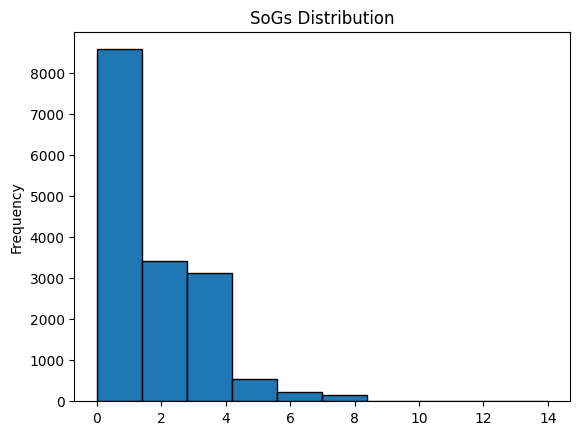

In [218]:
# Looking at the distribution of Last 1 column, giving us an Idea about typical SoG distribution
test_moving_avgs["SoGs"].plot(kind='hist', edgecolor='black', title="SoGs Distribution")

We see that there is a very heavy distribution at 0 thru 2. There is decent representation at 3, 4 but we see very few at 5+

### Modeling

In [219]:
# Create Model Excluding a subset of players and using them as test data
test_moving_avgs.head()

select_players = ['J. Hughes']

sog_select = test_moving_avgs[test_moving_avgs['Player Name'].isin(select_players)]
sog_select.head()

# Remove players from selected list
sog_select_train = test_moving_avgs[~test_moving_avgs['Player Name'].isin(select_players)]


x_test_select = sog_select.loc[:,['Average SoGs', 'Trailing 1 Game Avg SoGs', 'Trailing 3 Game Avg SoGs', 'Trailing 5 Game Avg SoGs', 'Trailing 10 Game Avg SoGs']]
y_test_select2 = sog_select.loc[:,'Over 1.5']
y_test_select3 = sog_select.loc[:,'Over 2.5']
y_test_select4 = sog_select.loc[:,'Over 3.5']
y_test_select5 = sog_select.loc[:,'Over 4.5']

# x_train_select = sog_select_train.iloc[:,6:-1]
x_train_select = sog_select_train.loc[:,['Average SoGs', 'Trailing 1 Game Avg SoGs', 'Trailing 3 Game Avg SoGs', 'Trailing 5 Game Avg SoGs', 'Trailing 10 Game Avg SoGs']]

y_train_select2 = sog_select_train.loc[:,'Over 1.5']
y_train_select3 = sog_select_train.loc[:,'Over 2.5']
y_train_select4 = sog_select_train.loc[:,'Over 3.5']
y_train_select5 = sog_select_train.loc[:,'Over 4.5']

scaler = preprocessing.StandardScaler()
scaler = scaler.fit(x_train_select)
x_train_select = scaler.transform(x_train_select)
x_test_select = scaler.transform(x_test_select)


pickle.dump( scaler, open( "scaler.p", "wb" ) )




In [220]:
# Train selected model
logistic_clf2 = LogisticRegression().fit(x_train_select, y_train_select2)
pickle.dump( logistic_clf2, open( "2sogs.p", "wb" ) )

logistic_clf3 = LogisticRegression().fit(x_train_select, y_train_select3)
pickle.dump( logistic_clf3, open( "3sogs.p", "wb" ) )

logistic_clf4 = LogisticRegression().fit(x_train_select, y_train_select4)
pickle.dump( logistic_clf4, open( "4sogs.p", "wb" ) )

logistic_clf5 = LogisticRegression().fit(x_train_select, y_train_select5)
pickle.dump( logistic_clf4, open( "5sogs.p", "wb" ) )

logistic_preds5 = logistic_clf5.predict(x_test_select)

print(f"Accuracy is {metrics.accuracy_score(y_test_select5,logistic_preds5)}")
print(f"Precision is {metrics.precision_score(y_test_select5, logistic_preds5, pos_label=1)}")
print(f"Recall is {metrics.recall_score(y_test_select5,logistic_preds5, pos_label=1)}")

Accuracy is 0.5
Precision is 0.6666666666666666
Recall is 0.16666666666666666


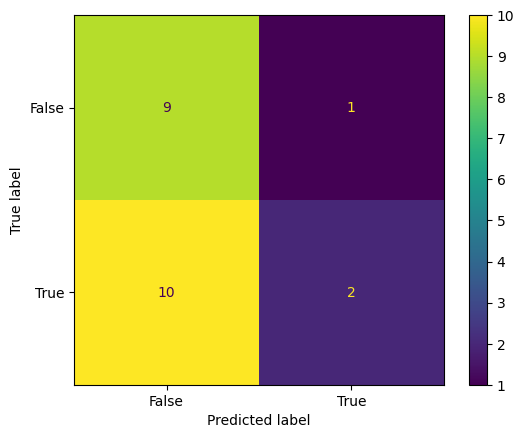

In [221]:
# Select model confusion matrix 
select_confusion_matrix = metrics.confusion_matrix(y_test_select5,logistic_preds5)
select_display = metrics.ConfusionMatrixDisplay(confusion_matrix = select_confusion_matrix, display_labels = [False, True])

select_display.plot()
plt.show()